In [1]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

In [2]:
%pylab inline
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

################################################################################

from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import glob
import cv2
import os
from datetime import datetime

################################################################################

import tensorflow.compat.v2 as tf
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.python.keras.losses import BinaryCrossentropy
from tensorflow.keras.applications.vgg16 import VGG16
from segmentation_models.losses import jaccard_loss, dice_loss, categorical_focal_loss, categorical_focal_jaccard_loss, categorical_focal_dice_loss

################################################################################
try :
    import import_ipynb
except :
    !pip install import-ipynb
    import import_ipynb
from Brice_KENGNI_ZANGUIM_2_1_script_functions_25_10_2022 import *

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib
Segmentation Models: using `keras` framework.
importing Jupyter notebook from Brice_KENGNI_ZANGUIM_2_1_script_functions_25_10_2022.ipynb


In [3]:
config = tf.compat.v1.ConfigProto( device_count = { 'GPU': 5 , 'CPU': 1 } )
sess = tf.compat.v1.Session( config = config )
keras.backend.set_session( sess )

In [4]:
tf.config.list_physical_devices("GPU")

[]

In [5]:
tf.__version__

'2.9.1'

In [6]:
keras.__version__

'2.9.0'

In [7]:
pd.__version__

'1.4.4'

In [8]:
np.__version__

'1.21.5'

In [9]:
model_name = "Transfert_learning_PSPNET"

# <strong> I - Acquisition des données à utiliserMaxNLocator

- ###  <strong> Chemin d'accès aux fichiers images et aux masks </strong>

In [10]:
chemin_image = os.getcwd()+"/datas/contraste/" 
chemin_masque_labelIds = os.getcwd()+"/datas/masque_labelIds/"

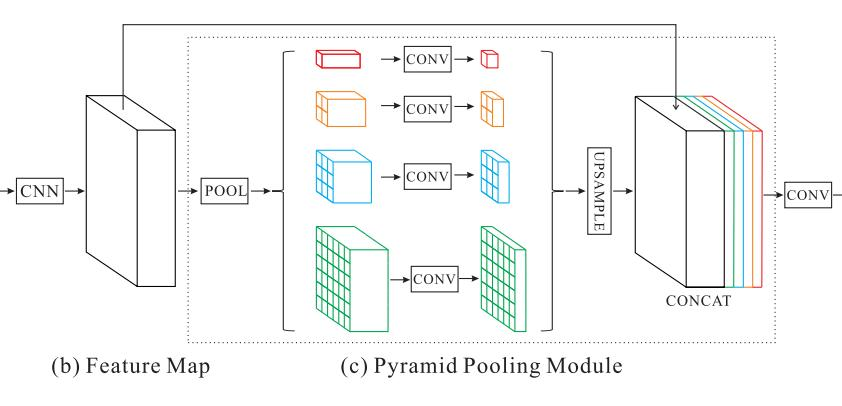

# <strong> II - Construction du modèle

- ###  <strong> definition </strong>

In [11]:
# Modèle UNET préentrainé sur Imagenet avec une couche de compression de type VGG16
def TL_PSPNET_model(input_shape, canaux_de_sortie ):
    
    from segmentation_models import PSPNet

    model = PSPNet( 
                    backbone_name='vgg16',
                    input_shape= input_shape,
                    classes= canaux_de_sortie,
                    activation='softmax',
                    weights=None,
                    encoder_weights='imagenet',
                    encoder_freeze=True,
                    downsample_factor=4,
                    psp_conv_filters=256,
                    psp_pooling_type='max',
                    psp_use_batchnorm=True,
                    psp_dropout=0.1,
                  )

    model.summary()
    return model

# <strong> A - Sans augmentation de données avec fonction perte de type jaccard_loss

In [12]:
#resolution des images et masques
aug_1 = False
perte_1 = "jaccard_loss"
img_res = (144,288,3)

In [13]:
model_1 = TL_PSPNET_model( img_res , 8)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 144, 288, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 144, 288, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 144, 288, 64  36928       ['block1_conv1[0][0]']           
                                )                                                             

In [14]:
# binary_crossentropy, categorical_crossentropy, sparse_categorical_crossentropy

model_1.compile(optimizer = Adam(lr = 2.e-2), 
                loss = jaccard_loss , 
                metrics = [ ARI_score, mean_IoU, dice_coeff, Tversky_coef ],
                run_eagerly=True
               )  

##################################################
###########     POINTS DE CONTROLE     ###########
checkpoint_path_1 = f"models/{model_name}_Loss={perte_1}_aug={aug_1}_/cp.ckpt"
checkpoint_dir_1 = os.path.dirname(checkpoint_path_1)


#############################################
###########     MES CALBACKS     ############
# Seuil de convergence
my_callback = MyCallback(0.85)
# Update du learning rate
learning_rate_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Sauvegarde des poids du modèle
cp_callback_1 = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_path_1,
                                                   save_weights_only = True,
                                                   verbose = 1,
                                                   save_freq=40
                                                  )
early_stopping_1 = tf.keras.callbacks.EarlyStopping(
                                                    monitor='loss',
                                                    min_delta=0.001,
                                                    patience=10,
                                                    verbose= 1,
                                                    mode='min',
                                                    baseline=None,
                                                    restore_best_weights=True
                                                    )

###################################################
###############                     ###############
MyImagesGenerator.nombre_d_instances = 0
charger_les_poids_1 = False

In [15]:
if  charger_les_poids_1 :
    model_1.load_weights(checkpoint_path_1)
    
history_1 = model_1.fit_generator( 
    generator = MyImagesGenerator(chemin_image, chemin_masque_labelIds,30, True, augmentation=aug_1, taille_des_donnees= 120, target_size=img_res),
    validation_data = MyImagesGenerator(chemin_image, chemin_masque_labelIds,20, True, augmentation=aug_1, taille_des_donnees= 40, target_size=img_res),
    epochs= 450,
    max_queue_size=12,
    callbacks = [ my_callback, learning_rate_callback, cp_callback_1 , early_stopping_1] ,
    use_multiprocessing= False
)
# Sauvegarde complète du modèle
model_1.save(checkpoint_dir_1+f"/Complete_model_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.h5")


Epoch 1/450
4/4 [==============================] - 90s 22s/step - loss: 0.8875 - ARI_score: 2.4360 - mean_IoU: 0.2659 - dice_coeff: 0.4037 - Tversky_coef: 0.2269 - val_loss: 0.8606 - val_ARI_score: 0.1243 - val_mean_IoU: 0.3363 - val_dice_coeff: 0.5028 - val_Tversky_coef: 0.2355 - lr: 0.0200
Epoch 2/450
4/4 [==============================] - 88s 21s/step - loss: 0.8126 - ARI_score: -1.0985 - mean_IoU: 0.4244 - dice_coeff: 0.5955 - Tversky_coef: 0.2437 - val_loss: 0.8745 - val_ARI_score: 2.4761 - val_mean_IoU: 0.2796 - val_dice_coeff: 0.4366 - val_Tversky_coef: 0.2297 - lr: 0.0200
Epoch 3/450
4/4 [==============================] - 93s 24s/step - loss: 0.8008 - ARI_score: 173.7995 - mean_IoU: 0.4305 - dice_coeff: 0.6012 - Tversky_coef: 0.2442 - val_loss: 0.8485 - val_ARI_score: -3.1755 - val_mean_IoU: 0.3448 - val_dice_coeff: 0.5126 - val_Tversky_coef: 0.2364 - lr: 0.0200
Epoch 4/450
4/4 [==============================] - 94s 23s/step - loss: 0.7929 - ARI_score: -0.3406 - mean_IoU: 0.440

In [16]:
result_1  = pd.DataFrame( history_1.history )
result_1.drop(["lr"], axis=1, inplace=True)
result_1["modèle"] = [model_name for _ in range( result_1.shape[0])]
result_1["Loss"] = [perte_1 for _ in range( result_1.shape[0])]
result_1["Augmentation"] = [aug_1 for _ in range( result_1.shape[0])]
result_1.to_csv( f"{model_name}_loss={perte_1}_augment={aug_1}_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.csv", index = False )
result_1

,loss,ARI_score,mean_IoU,dice_coeff,Tversky_coef,val_loss,val_ARI_score,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.887474,2.435984,0.265940,0.403685,0.226862,0.860646,0.124312,0.336317,0.502790,0.235505,Transfert_learning_PSPNET,jaccard_loss,False
1,0.812603,-1.098452,0.424440,0.595544,0.243697,0.874512,2.476083,0.279609,0.436621,0.229663,Transfert_learning_PSPNET,jaccard_loss,False
2,0.800845,173.799515,0.430456,0.601215,0.244178,0.848475,-3.175472,0.344751,0.512563,0.236370,Transfert_learning_PSPNET,jaccard_loss,False
3,0.792862,-0.340610,0.440267,0.610977,0.245039,0.827923,-5.029721,0.374284,0.544525,0.239189,Transfert_learning_PSPNET,jaccard_loss,False
4,0.790451,-3.570469,0.447567,0.618225,0.245667,0.841862,1.662524,0.342046,0.509395,0.236093,Transfert_learning_PSPNET,jaccard_loss,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
58,0.757026,3.011812,0.485584,0.653451,0.248774,0.778580,10.479229,0.475752,0.644748,0.248027,Transfert_learning_PSPNET,jaccard_loss,False
59,0.756782,-1.918072,0.483794,0.651743,0.248626,0.778384,-1.092834,0.476102,0.644280,0.247985,Transfert_learning_PSPNET,jaccard_loss,False
60,0.756570,-1.944986,0.485904,0.653830,0.248807,0.777518,2.039125,0.468346,0.637397,0.247389,Transfert_learning_PSPNET,jaccard_loss,False
61,0.756631,1.721786,0.483513,0.651751,0.248627,0.776971,-6.024940,0.476121,0.643808,0.247946,Transfert_learning_PSPNET,jaccard_loss,False


In [17]:
start = 2

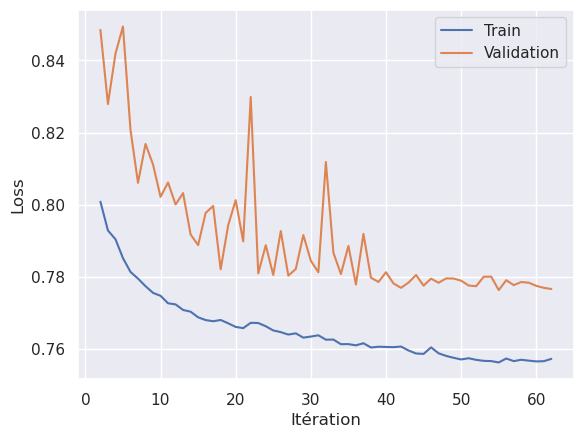

In [18]:
plt.plot(result_1.index[start:], result_1["loss"][start:])
plt.plot(result_1.index[start:], result_1["val_loss"][start:])
plt.xlabel('Itération')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()
#plt.plot(result.index, result["dice_coeff"])


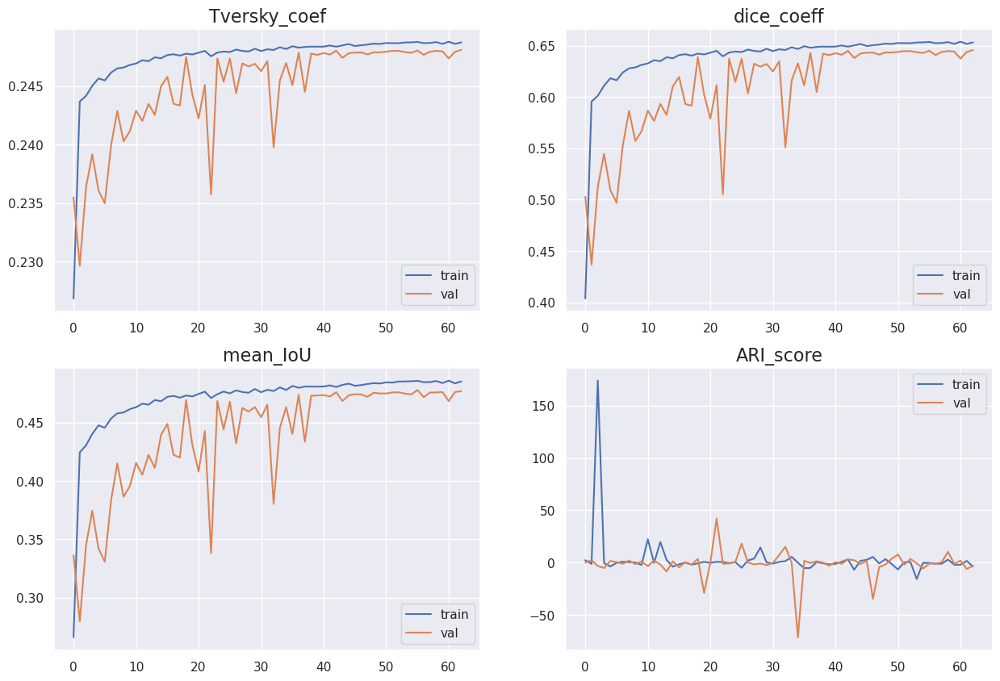

In [19]:
afficher_les_metriques( result_1 )

In [20]:
img_gen = MyImagesGenerator( chemin_image, chemin_masque_labelIds,10, True, augmentation=aug_1, taille_des_donnees = 30 , target_size=img_res)

img, mask = img_gen.__getitem__(0)

In [21]:
img.shape

(10, 144, 288, 3)

In [22]:
mask.shape

(10, 144, 288, 8)

In [23]:
mask_pred = model_1.predict(img)

1/1 [==============================] - 1s 1s/step


In [24]:
mask_pred.shape

(10, 144, 288, 8)

In [25]:
transformer = Mask_To_8_Groups( )

In [26]:
mask_pred = [ transformer.invers_transform(i) for i in mask_pred ]

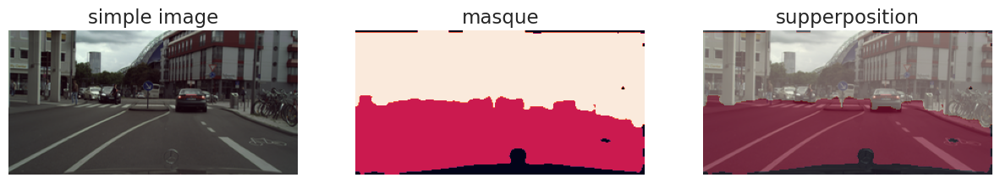

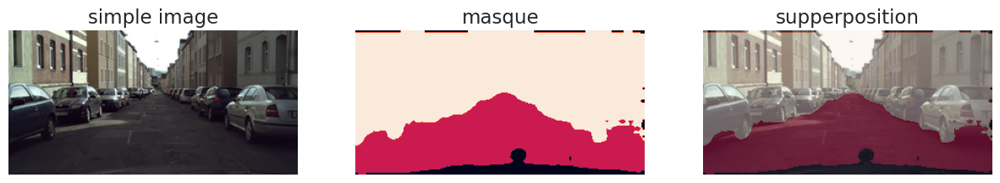

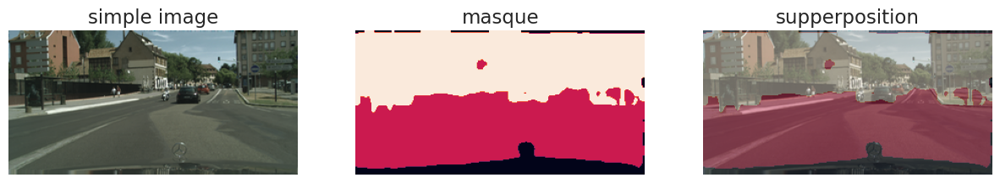

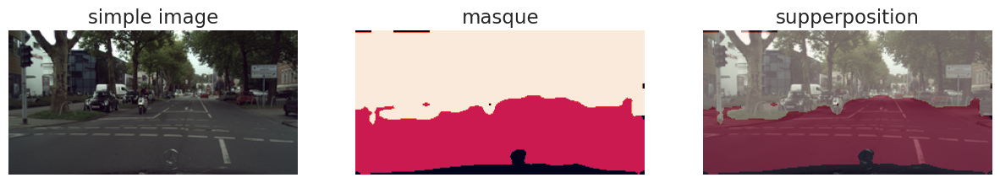

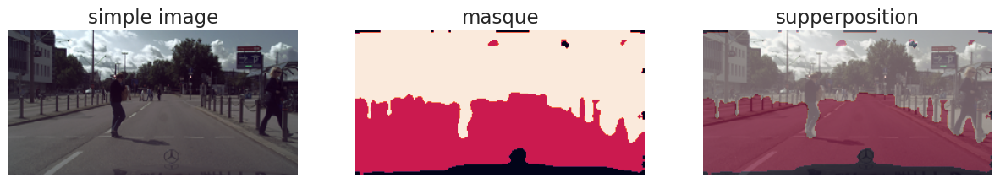

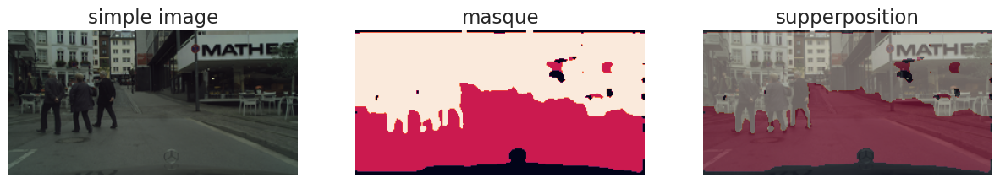

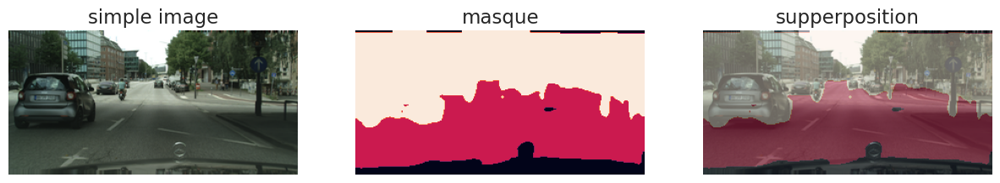

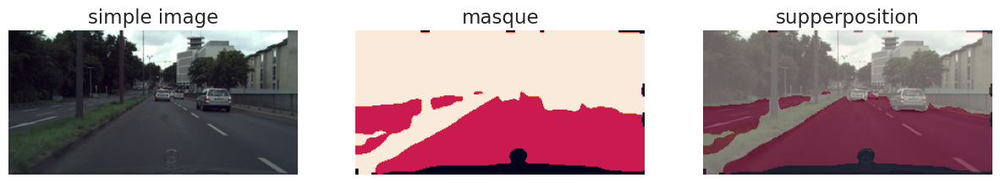

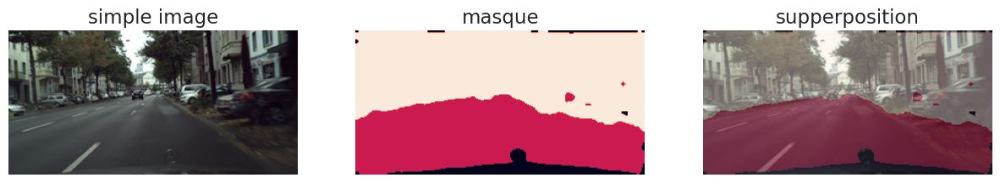

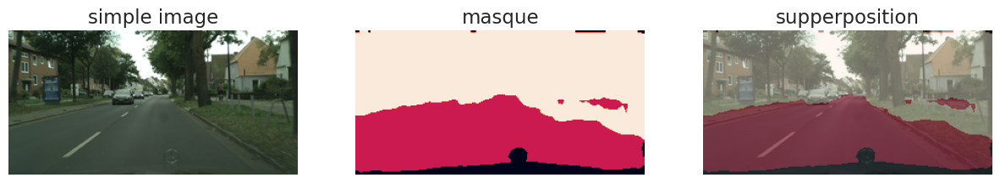

In [27]:
for i in range(10) :
    afficher_les_images_supperposees(img[i], mask_pred[i], style=3)

# <strong> B - Sans augmentation de données et fonction perte de type dice_loss

In [28]:
#resolution des images et masques
aug_2 = False
perte_2 = "dice_loss"
img_res = (144,288,3)

In [29]:
model_2 = TL_PSPNET_model( img_res , 8)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 144, 288, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 144, 288, 64  1792        ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 144, 288, 64  36928       ['block1_conv1[0][0]']           
                                )                                                           

In [30]:
# binary_crossentropy, categorical_crossentropy, sparse_categorical_crossentropy

model_2.compile(optimizer = Adam(lr = 2.e-2),
                loss = dice_loss ,
                metrics = [ARI_score, mean_IoU, dice_coeff, Tversky_coef ],
                run_eagerly=True
               )  

##################################################
###########     POINTS DE CONTROLE     ###########
checkpoint_path_2 = f"models/{model_name}_Loss={perte_2}_aug={aug_2}_/cp.ckpt"
checkpoint_dir_2 = os.path.dirname(checkpoint_path_2)


#############################################
###########     MES CALBACKS     ############
# Seuil de convergence
my_callback = MyCallback(0.85)
# Update du learning rate
learning_rate_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Sauvegarde des poids du modèle
cp_callback_2 = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_path_2,
                                                   save_weights_only = True,
                                                   verbose = 1,
                                                   save_freq = 40
                                                  )
early_stopping_2 = tf.keras.callbacks.EarlyStopping(
                                                    monitor='loss',
                                                    min_delta=0.001,
                                                    patience=10,
                                                    verbose= 1,
                                                    mode='min',
                                                    baseline=None,
                                                    restore_best_weights=True
                                                    )

###################################################
###############                     ###############
MyImagesGenerator.nombre_d_instances = 0
charger_les_poids_2 = False

In [31]:
if charger_les_poids_2 : 
    model_2.load_weights(checkpoint_path_2)
    

history_2 = model_2.fit_generator( 
    generator= MyImagesGenerator(chemin_image, chemin_masque_labelIds,30, True, augmentation=aug_2, taille_des_donnees= 120, target_size=img_res),
    validation_data= MyImagesGenerator(chemin_image, chemin_masque_labelIds,20, True, augmentation=aug_2, taille_des_donnees= 40, target_size=img_res),
    epochs=450,
    callbacks = [ my_callback, learning_rate_callback, cp_callback_2, early_stopping_2 ],
    max_queue_size=12,
    use_multiprocessing= False
)
# Sauvegarde complète du modèle
model_2.save(checkpoint_dir_2+f"/Complete_model_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.h5")

Epoch 1/450
4/4 [==============================] - 95s 24s/step - loss: 0.5350 - ARI_score: -0.9732 - mean_IoU: 0.3226 - dice_coeff: 0.4650 - Tversky_coef: 0.2322 - val_loss: 0.5976 - val_ARI_score: 13.4014 - val_mean_IoU: 0.2523 - val_dice_coeff: 0.4024 - val_Tversky_coef: 0.2266 - lr: 0.0200
Epoch 2/450
4/4 [==============================] - 94s 24s/step - loss: 0.3724 - ARI_score: -0.2706 - mean_IoU: 0.4573 - dice_coeff: 0.6276 - Tversky_coef: 0.2465 - val_loss: 0.4302 - val_ARI_score: -0.2329 - val_mean_IoU: 0.4005 - val_dice_coeff: 0.5698 - val_Tversky_coef: 0.2414 - lr: 0.0200
Epoch 3/450
4/4 [==============================] - 93s 24s/step - loss: 0.3446 - ARI_score: -0.9602 - mean_IoU: 0.4877 - dice_coeff: 0.6554 - Tversky_coef: 0.2489 - val_loss: 0.4300 - val_ARI_score: 6.0208 - val_mean_IoU: 0.3986 - val_dice_coeff: 0.5700 - val_Tversky_coef: 0.2414 - lr: 0.0200
Epoch 4/450
4/4 [==============================] - 99s 25s/step - loss: 0.3393 - ARI_score: 0.0979 - mean_IoU: 0.493

In [32]:
result_2  = pd.DataFrame( history_2.history )
result_2.drop(["lr"], axis = 1, inplace = True)
result_2["modèle"] = [model_name for _ in range( result_2.shape[0])]
result_2["Loss"] = [perte_2 for _ in range( result_2.shape[0])]
result_2["Augmentation"] = [aug_2 for _ in range( result_2.shape[0])]
result_2.to_csv(f"{model_name}_loss={perte_2}_augment={aug_2}_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.csv", index=False)
result_2

,loss,ARI_score,mean_IoU,dice_coeff,Tversky_coef,val_loss,val_ARI_score,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.535048,-0.973213,0.322641,0.464952,0.232243,0.597620,13.401422,0.252258,0.402379,0.226649,Transfert_learning_PSPNET,dice_loss,False
1,0.372446,-0.270601,0.457301,0.627554,0.246498,0.430203,-0.232887,0.400456,0.569797,0.241417,Transfert_learning_PSPNET,dice_loss,False
2,0.344587,-0.960163,0.487729,0.655413,0.248933,0.429952,6.020773,0.398649,0.570048,0.241442,Transfert_learning_PSPNET,dice_loss,False
3,0.339264,0.097933,0.493645,0.660736,0.249395,0.395704,1.013996,0.433765,0.604296,0.244457,Transfert_learning_PSPNET,dice_loss,False
4,0.333777,10.680696,0.499612,0.666223,0.249879,0.404492,10.202295,0.424040,0.595508,0.243682,Transfert_learning_PSPNET,dice_loss,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
62,0.286450,-2.477772,0.554925,0.713550,0.254048,0.365244,4.522799,0.465240,0.634756,0.247144,Transfert_learning_PSPNET,dice_loss,False
63,0.286242,5.469671,0.555149,0.713758,0.254065,0.330561,-0.093982,0.503233,0.669439,0.250201,Transfert_learning_PSPNET,dice_loss,False
64,0.286724,0.826177,0.554409,0.713276,0.254023,0.328210,0.749612,0.506821,0.671790,0.250405,Transfert_learning_PSPNET,dice_loss,False
65,0.286134,0.266600,0.555447,0.713866,0.254075,0.340171,-2.996376,0.492503,0.659829,0.249354,Transfert_learning_PSPNET,dice_loss,False


In [33]:
start = 0

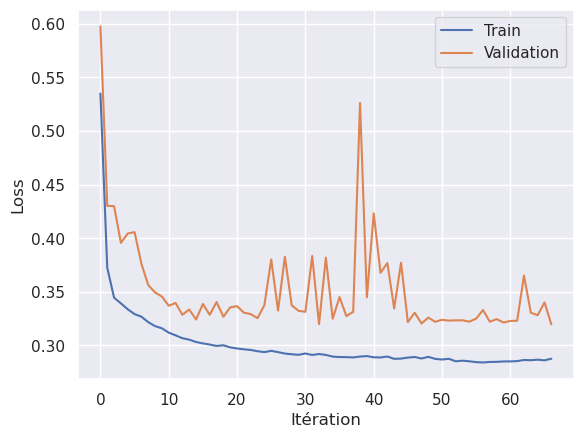

In [34]:
plt.plot(result_2.index[start:], result_2["loss"][start:])
plt.plot(result_2.index[start:], result_2["val_loss"][start:])
plt.xlabel('Itération')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()
#plt.plot(result.index, result["dice_coeff"])


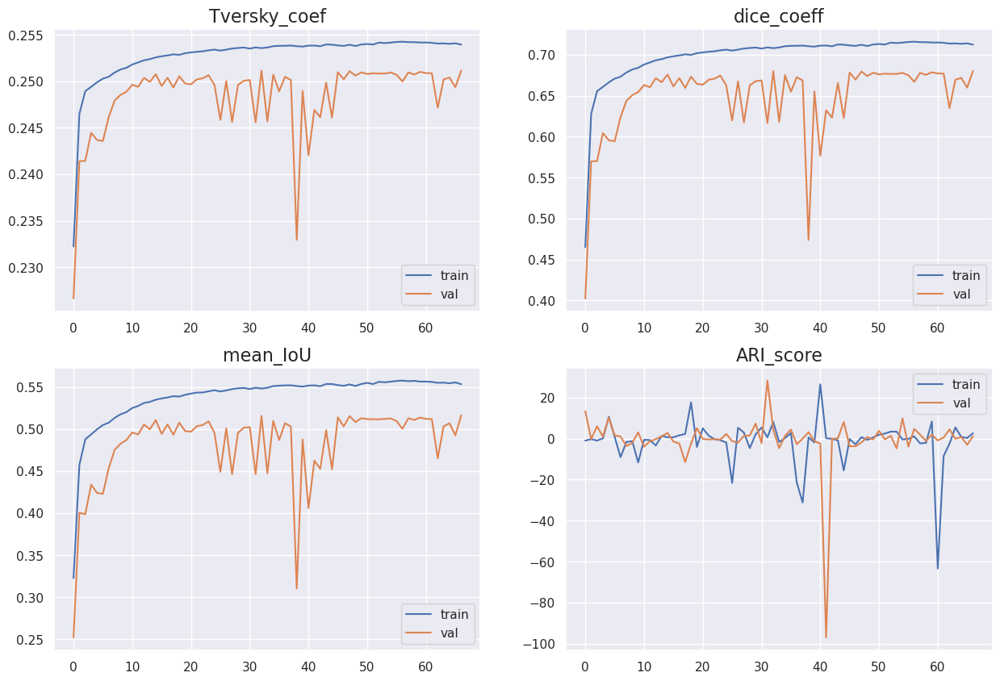

In [35]:
afficher_les_metriques( result_2 )

In [36]:
img_gen = MyImagesGenerator( chemin_image, chemin_masque_labelIds,10, True, augmentation=aug_2, taille_des_donnees = 30 , target_size=img_res)

img, mask = img_gen.__getitem__(0)

In [37]:
img.shape

(10, 144, 288, 3)

In [38]:
mask.shape

(10, 144, 288, 8)

In [39]:
mask_pred = model_2.predict(img)

1/1 [==============================] - 1s 1s/step


In [40]:
mask_pred.shape

(10, 144, 288, 8)

In [41]:
transformer = Mask_To_8_Groups()

In [42]:
mask_pred = [ transformer.invers_transform(i) for i in mask_pred]

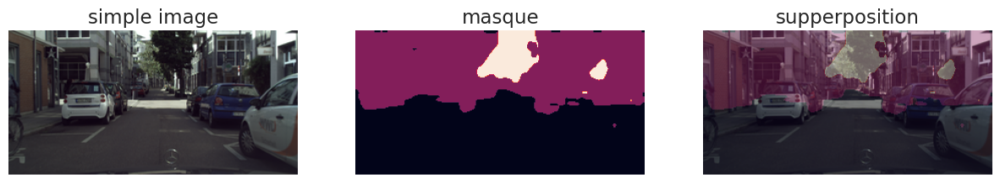

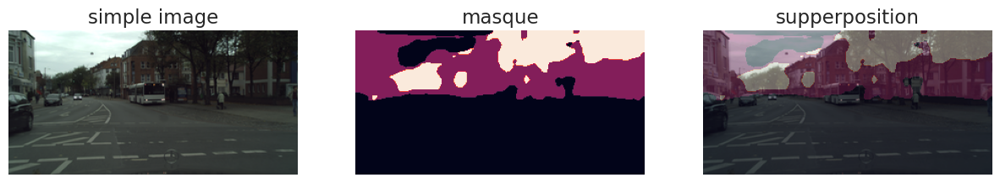

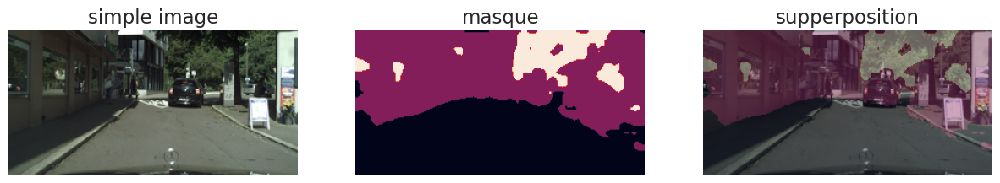

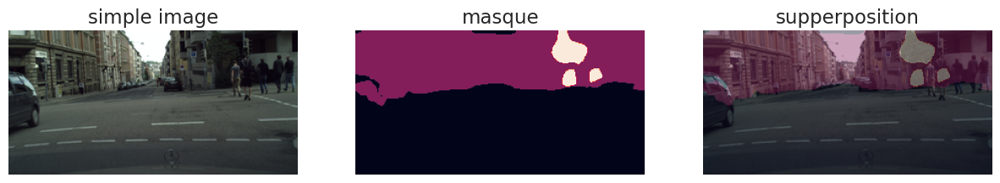

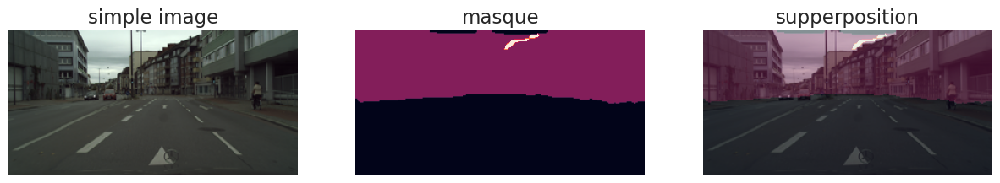

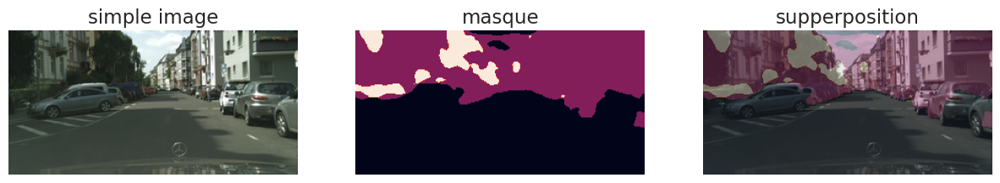

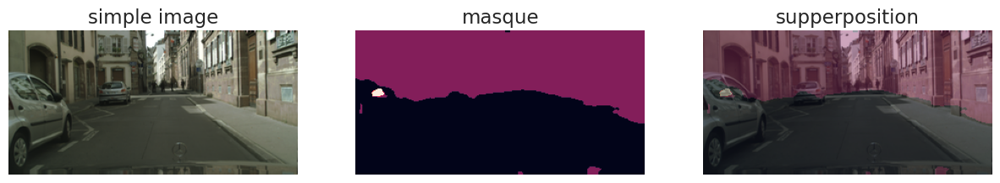

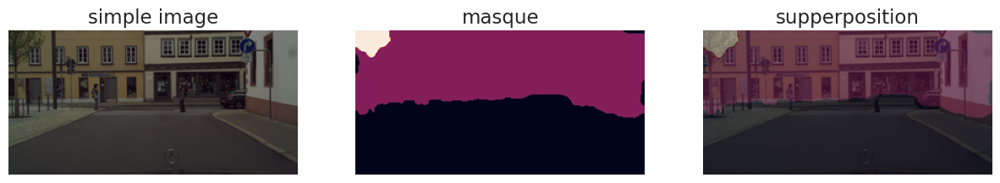

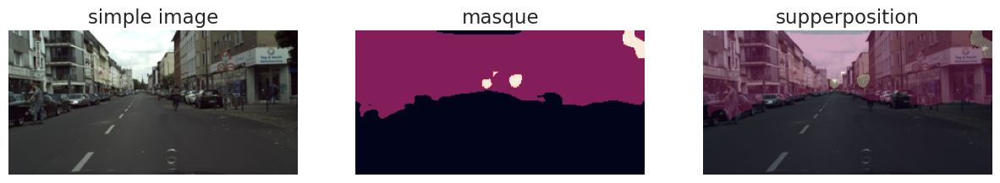

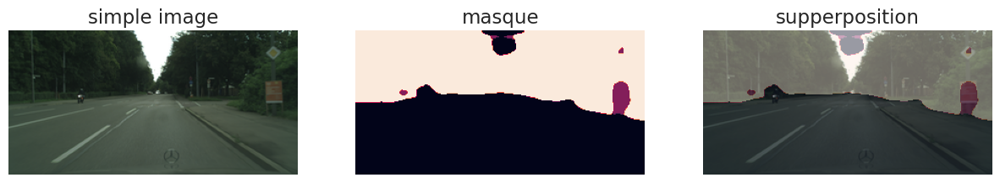

In [43]:
for i in range(10) :
    afficher_les_images_supperposees(img[i], mask_pred[i], style=3)

# <strong> C - Sans augmentation de données avec fonction perte de type categorical_focal_loss

In [44]:
#resolution des images et masques
aug_3 = False
perte_3 = "categorical_focal_loss"
img_res = (144,288,3)

In [45]:
model_3 = TL_PSPNET_model( img_res , 8)

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 144, 288, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 144, 288, 64  1792        ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 144, 288, 64  36928       ['block1_conv1[0][0]']           
                                )                                                           

In [46]:
# binary_crossentropy, categorical_crossentropy, sparse_categorical_crossentropy

model_3.compile(optimizer = Adam(lr = 2.e-2),
                loss = categorical_focal_loss ,
                metrics = [ARI_score, mean_IoU,dice_coeff, Tversky_coef ],
                run_eagerly=True 
               )  

##################################################
###########     POINTS DE CONTROLE     ###########
checkpoint_path_3 = f"models/{model_name}_Loss={perte_3}_aug={aug_3}_/cp.ckpt"
checkpoint_dir_3 = os.path.dirname(checkpoint_path_3)


#############################################
###########     MES CALBACKS     ############
# Seuil de convergence
my_callback = MyCallback(0.85)
# Update du learning rate
learning_rate_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Sauvegarde des poids du modèle
cp_callback_3 = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_path_3,
                                                   save_weights_only = True,
                                                   verbose = 1,
                                                   save_freq = 40
                                                  )
early_stopping_3 = tf.keras.callbacks.EarlyStopping(
                                                    monitor='loss',
                                                    min_delta=0.001,
                                                    patience=10,
                                                    verbose= 1,
                                                    mode='min',
                                                    baseline=None,
                                                    restore_best_weights=True
                                                    )

###################################################
###############                     ###############
MyImagesGenerator.nombre_d_instances = 0
charger_les_poids_3 = False

In [47]:
if charger_les_poids_3 :
    model_3.load_weights(checkpoint_path_3)
    

history_3 = model_3.fit_generator( 
    generator= MyImagesGenerator(chemin_image, chemin_masque_labelIds,30, True, augmentation=aug_3, taille_des_donnees= 120, target_size=img_res),
    validation_data= MyImagesGenerator(chemin_image, chemin_masque_labelIds,20, True, augmentation=aug_3, taille_des_donnees= 40, target_size=img_res),
    epochs= 450,
    callbacks = [ my_callback, learning_rate_callback, cp_callback_3, early_stopping_3 ],
    max_queue_size=12,
    use_multiprocessing= False
)
# Sauvegarde complète du modèle
model_3.save(checkpoint_dir_3+f"/Complete_model_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.h5")

Epoch 1/450
4/4 [==============================] - 93s 23s/step - loss: 0.1313 - ARI_score: 1.3362 - mean_IoU: 0.2292 - dice_coeff: 0.3581 - Tversky_coef: 0.2230 - val_loss: 0.3460 - val_ARI_score: -0.4371 - val_mean_IoU: 0.1736 - val_dice_coeff: 0.2956 - val_Tversky_coef: 0.2171 - lr: 0.0200
Epoch 2/450
4/4 [==============================] - 90s 22s/step - loss: 0.1136 - ARI_score: 0.5662 - mean_IoU: 0.4614 - dice_coeff: 0.6306 - Tversky_coef: 0.2470 - val_loss: 0.3578 - val_ARI_score: 0.7073 - val_mean_IoU: 0.1424 - val_dice_coeff: 0.2494 - val_Tversky_coef: 0.2131 - lr: 0.0200
Epoch 3/450
4/4 [==============================] - 90s 22s/step - loss: 0.1107 - ARI_score: 0.3170 - mean_IoU: 0.5053 - dice_coeff: 0.6712 - Tversky_coef: 0.2505 - val_loss: 0.2516 - val_ARI_score: 0.9283 - val_mean_IoU: 0.2832 - val_dice_coeff: 0.4413 - val_Tversky_coef: 0.2300 - lr: 0.0200
Epoch 4/450
4/4 [==============================] - 92s 22s/step - loss: 0.0941 - ARI_score: -2.3631 - mean_IoU: 0.5066 -

In [48]:
result_3  = pd.DataFrame( history_3.history )
result_3.drop(["lr"], axis = 1, inplace = True)
result_3["modèle"] = [model_name for _ in range( result_3.shape[0])]
result_3["Loss"] = [perte_3 for _ in range( result_3.shape[0])]
result_3["Augmentation"] = [aug_3 for _ in range( result_3.shape[0])]
result_3.to_csv(f"{model_name}_loss={perte_3}_augment={aug_3}_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.csv", index=False)
result_3

,loss,ARI_score,mean_IoU,dice_coeff,Tversky_coef,val_loss,val_ARI_score,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.131339,1.336163,0.229195,0.358073,0.222981,0.346016,-0.437099,0.173552,0.295580,0.217126,Transfert_learning_PSPNET,categorical_focal_loss,False
1,0.113578,0.566246,0.461379,0.630634,0.246957,0.357798,0.707271,0.142445,0.249366,0.213073,Transfert_learning_PSPNET,categorical_focal_loss,False
2,0.110707,0.317042,0.505274,0.671193,0.250487,0.251583,0.928276,0.283156,0.441335,0.230034,Transfert_learning_PSPNET,categorical_focal_loss,False
3,0.094144,-2.363091,0.506596,0.672488,0.250742,0.233826,-0.500251,0.298320,0.459297,0.231655,Transfert_learning_PSPNET,categorical_focal_loss,False
4,0.086850,-0.826854,0.530461,0.692835,0.252539,0.177284,-3.649954,0.390642,0.561752,0.240734,Transfert_learning_PSPNET,categorical_focal_loss,False
5,0.080535,0.985992,0.539914,0.700834,0.253289,0.164715,1.275337,0.396430,0.567592,0.241278,Transfert_learning_PSPNET,categorical_focal_loss,False
6,0.074815,1.183370,0.536984,0.698400,0.253192,0.145514,-2.185747,0.419364,0.590906,0.243397,Transfert_learning_PSPNET,categorical_focal_loss,False
7,0.070092,9.711474,0.513590,0.678528,0.251546,0.129611,26.614208,0.438637,0.609790,0.245117,Transfert_learning_PSPNET,categorical_focal_loss,False
8,0.063603,0.610158,0.505950,0.671911,0.251001,0.112777,-0.266804,0.471120,0.640341,0.247872,Transfert_learning_PSPNET,categorical_focal_loss,False
9,0.056572,1.395251,0.468038,0.637501,0.248075,0.103170,-2.255078,0.478081,0.646875,0.248480,Transfert_learning_PSPNET,categorical_focal_loss,False


In [49]:
start = 3

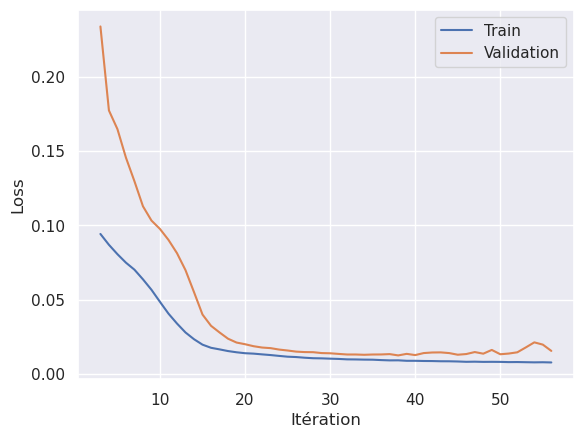

In [50]:
plt.plot(result_3.index[start:], result_3["loss"][start:])
plt.plot(result_3.index[start:], result_3["val_loss"][start:])
plt.xlabel('Itération')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()
#plt.plot(result.index, result["dice_coeff"])


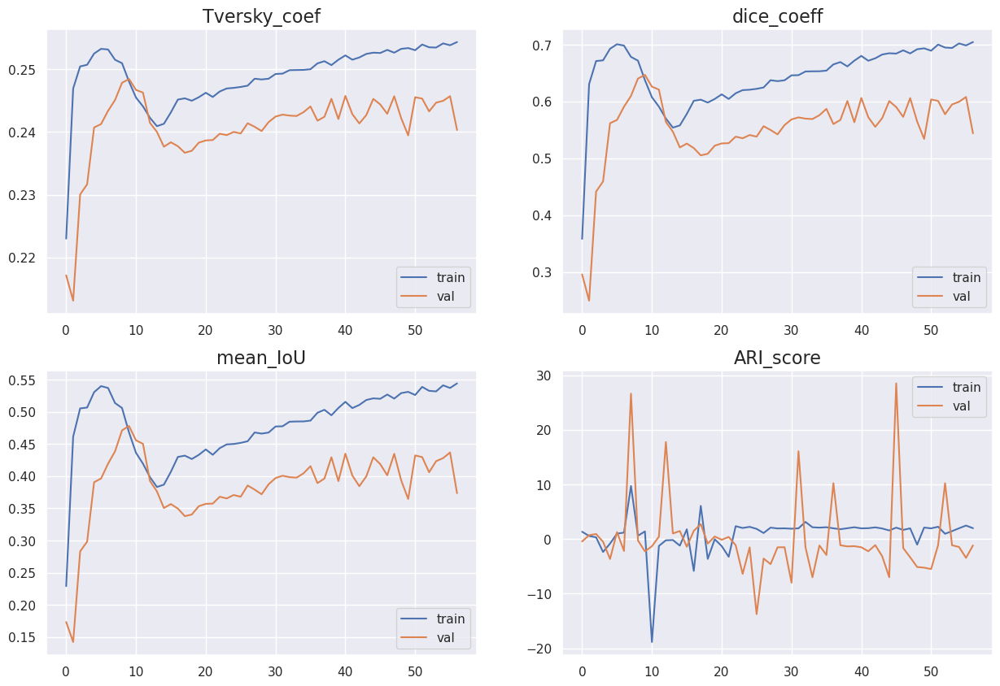

In [51]:
afficher_les_metriques( result_3 )

In [52]:
img_gen = MyImagesGenerator( chemin_image, chemin_masque_labelIds,10, True, augmentation=aug_3, taille_des_donnees = 30 , target_size=img_res)

img, mask = img_gen.__getitem__(0)

In [53]:
img.shape

(10, 144, 288, 3)

In [54]:
mask.shape

(10, 144, 288, 8)

In [55]:
mask_pred = model_3.predict(img)

1/1 [==============================] - 1s 811ms/step


In [56]:
mask_pred.shape

(10, 144, 288, 8)

In [57]:
transformer = Mask_To_8_Groups()

In [58]:
mask_pred = [ transformer.invers_transform(i) for i in mask_pred]

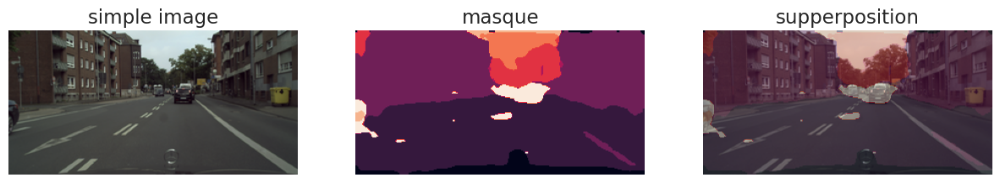

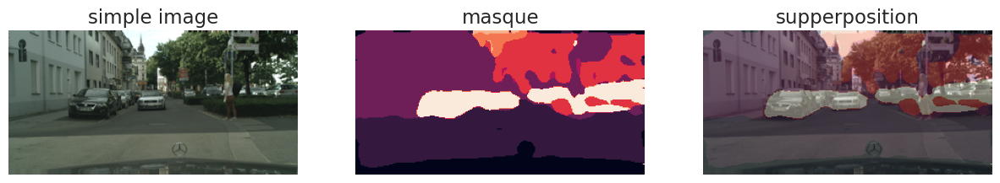

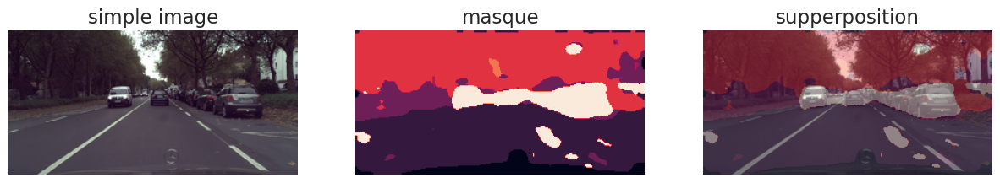

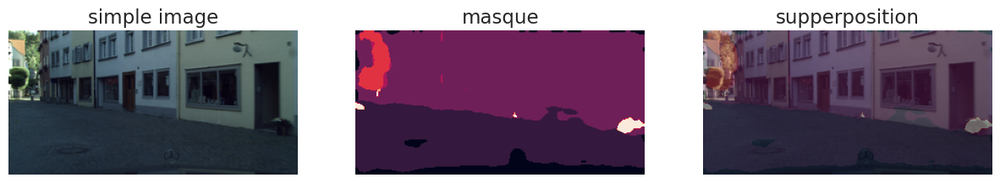

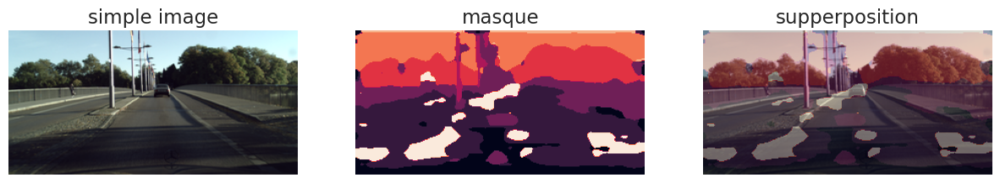

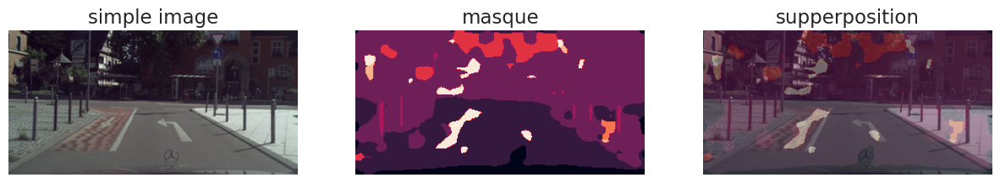

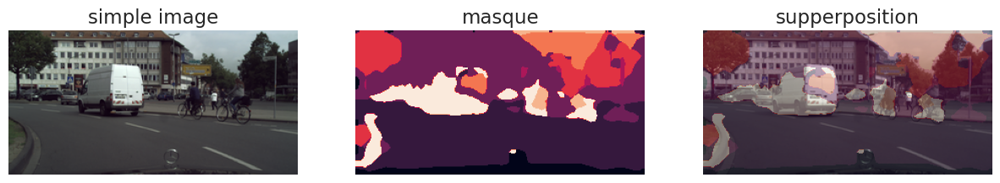

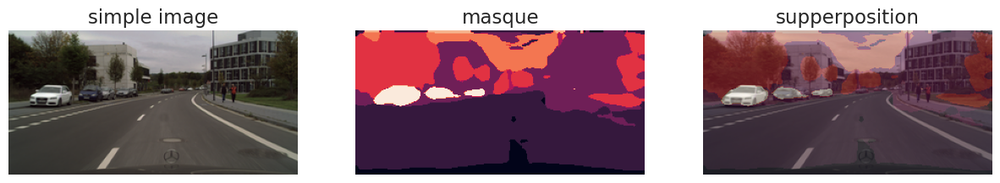

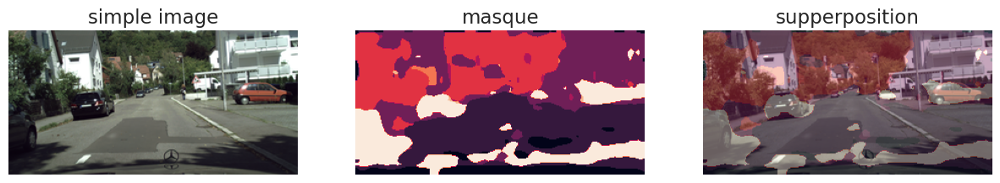

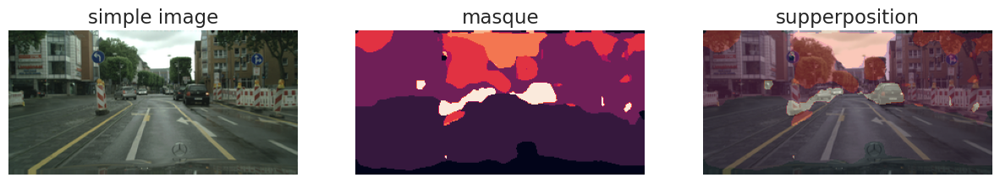

In [59]:
for i in range(10) :
    afficher_les_images_supperposees(img[i], mask_pred[i], style=3)

# <strong> D - Sans augmentation de données avec fonction perte de type categorical_focal_jaccard_loss

In [103]:
#resolution des images et masques
aug_4 = False
perte_4 = "categorical_focal_jaccard_loss"
img_res = (144,288,3)

In [104]:
model_4 = TL_PSPNET_model( img_res , 8)

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 144, 288, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 144, 288, 64  1792        ['input_6[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 144, 288, 64  36928       ['block1_conv1[0][0]']           
                                )                                                           

In [105]:
# binary_crossentropy, categorical_crossentropy, sparse_categorical_crossentropy

model_4.compile(optimizer = Adam(lr = 2.e-2 ),
                loss = categorical_focal_jaccard_loss ,
                metrics = [ARI_score, mean_IoU, dice_coeff, Tversky_coef ],
                run_eagerly=True
               )  

##################################################
###########     POINTS DE CONTROLE     ###########
checkpoint_path_4 = f"models/{model_name}_Loss={perte_4}_aug={aug_4}_/cp.ckpt"
checkpoint_dir_4 = os.path.dirname(checkpoint_path_4)


#############################################
###########     MES CALBACKS     ############
# Seuil de convergence
my_callback = MyCallback(0.85)
# Update du learning rate
learning_rate_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Sauvegarde des poids du modèle
cp_callback_4 = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_path_4,
                                                   save_weights_only = True,
                                                   verbose = 1,
                                                   save_freq = 40
                                                  )
early_stopping_4 = tf.keras.callbacks.EarlyStopping(
                                                    monitor='loss',
                                                    min_delta=0.001,
                                                    patience=15,
                                                    verbose= 1,
                                                    mode='min',
                                                    baseline=None,
                                                    restore_best_weights=True
                                                    )

###################################################
###############                     ###############
MyImagesGenerator.nombre_d_instances = 0
charger_les_poids_4 = True

In [106]:
if charger_les_poids_4  :
    model_4.load_weights(checkpoint_path_4)
    
    
history_4 = model_4.fit_generator( 
    generator= MyImagesGenerator(chemin_image, chemin_masque_labelIds,30, True, augmentation=aug_4, taille_des_donnees= 120, target_size=img_res),
    validation_data= MyImagesGenerator(chemin_image, chemin_masque_labelIds,20, True, augmentation=aug_4, taille_des_donnees= 40, target_size=img_res),
    epochs= 450,
    callbacks = [ my_callback, learning_rate_callback, cp_callback_4, early_stopping_4 ] ,
    max_queue_size=12,
    use_multiprocessing= False
)
# Sauvegarde complète du modèle
model_4.save(checkpoint_dir_4+f"/Complete_model_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.h5")

Epoch 1/450
4/4 [==============================] - 58s 14s/step - loss: 0.5083 - ARI_score: -1.2603 - mean_IoU: 0.6795 - dice_coeff: 0.8091 - Tversky_coef: 0.2626 - val_loss: 0.5784 - val_ARI_score: 0.9420 - val_mean_IoU: 0.5902 - val_dice_coeff: 0.7420 - val_Tversky_coef: 0.2568 - lr: 0.0295
Epoch 2/450
4/4 [==============================] - 53s 13s/step - loss: 0.4844 - ARI_score: -0.4516 - mean_IoU: 0.6883 - dice_coeff: 0.8153 - Tversky_coef: 0.2632 - val_loss: 0.5088 - val_ARI_score: 2.7046 - val_mean_IoU: 0.6913 - val_dice_coeff: 0.8175 - val_Tversky_coef: 0.2634 - lr: 0.0295
Epoch 3/450
4/4 [==============================] - 54s 13s/step - loss: 0.4651 - ARI_score: 0.5966 - mean_IoU: 0.7099 - dice_coeff: 0.8302 - Tversky_coef: 0.2645 - val_loss: 0.5968 - val_ARI_score: -3.7613 - val_mean_IoU: 0.5859 - val_dice_coeff: 0.7388 - val_Tversky_coef: 0.2565 - lr: 0.0295
Epoch 4/450
4/4 [==============================] - 55s 14s/step - loss: 0.4625 - ARI_score: 0.3707 - mean_IoU: 0.7051 

In [107]:
result_4  = pd.DataFrame( history_4.history )
result_4.drop(["lr"], axis = 1, inplace = True)
result_4["modèle"] = [model_name for _ in range( result_4.shape[0])]
result_4["Loss"] = [perte_4 for _ in range( result_4.shape[0])]
result_4["Augmentation"] = [aug_4 for _ in range( result_4.shape[0])]
result_4.to_csv(f"{model_name}_loss={perte_4}_augment={aug_4}_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.csv", index=False)
result_4

,loss,ARI_score,mean_IoU,dice_coeff,Tversky_coef,val_loss,val_ARI_score,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.508257,-1.260303,0.679465,0.809052,0.262648,0.578423,0.941993,0.590159,0.742000,0.256847,Transfert_learning_PSPNET,categorical_focal_jaccard_loss,False
1,0.484380,-0.451595,0.688295,0.815264,0.263196,0.508806,2.704647,0.691318,0.817450,0.263405,Transfert_learning_PSPNET,categorical_focal_jaccard_loss,False
2,0.465059,0.596594,0.709919,0.830209,0.264501,0.596798,-3.761257,0.585869,0.738822,0.256523,Transfert_learning_PSPNET,categorical_focal_jaccard_loss,False
3,0.462539,0.370728,0.705146,0.826837,0.264229,0.507893,-66.625290,0.669543,0.802010,0.262089,Transfert_learning_PSPNET,categorical_focal_jaccard_loss,False
4,0.442437,-1.669697,0.720279,0.837245,0.265139,0.537655,-0.215521,0.655058,0.791582,0.261176,Transfert_learning_PSPNET,categorical_focal_jaccard_loss,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
112,0.308659,-4.634078,0.821208,0.901825,0.270785,0.507143,1.045589,0.684170,0.812386,0.262946,Transfert_learning_PSPNET,categorical_focal_jaccard_loss,False
113,0.303843,-4.840177,0.826680,0.905108,0.271071,0.511114,1.288133,0.660918,0.795573,0.261494,Transfert_learning_PSPNET,categorical_focal_jaccard_loss,False
114,0.308712,7.167621,0.818973,0.900426,0.270668,0.515609,-1.539523,0.687324,0.814691,0.263135,Transfert_learning_PSPNET,categorical_focal_jaccard_loss,False
115,0.309398,-4.033301,0.819691,0.900909,0.270705,0.495386,-2.768606,0.696176,0.820848,0.263695,Transfert_learning_PSPNET,categorical_focal_jaccard_loss,False


In [108]:
start = 0

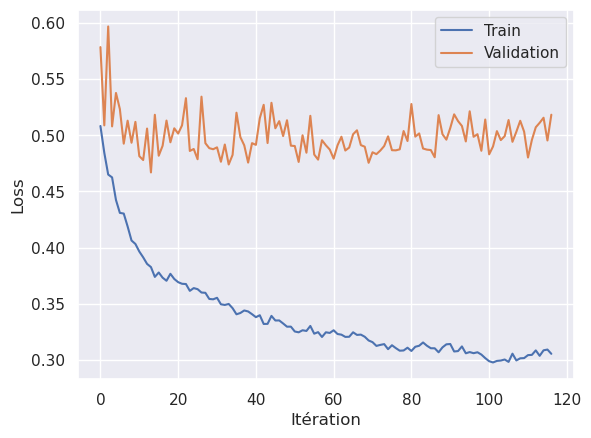

In [109]:
plt.plot(result_4.index[start:], result_4["loss"][start:])
plt.plot(result_4.index[start:], result_4["val_loss"][start:])
plt.xlabel('Itération')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()
#plt.plot(result.index, result["dice_coeff"])


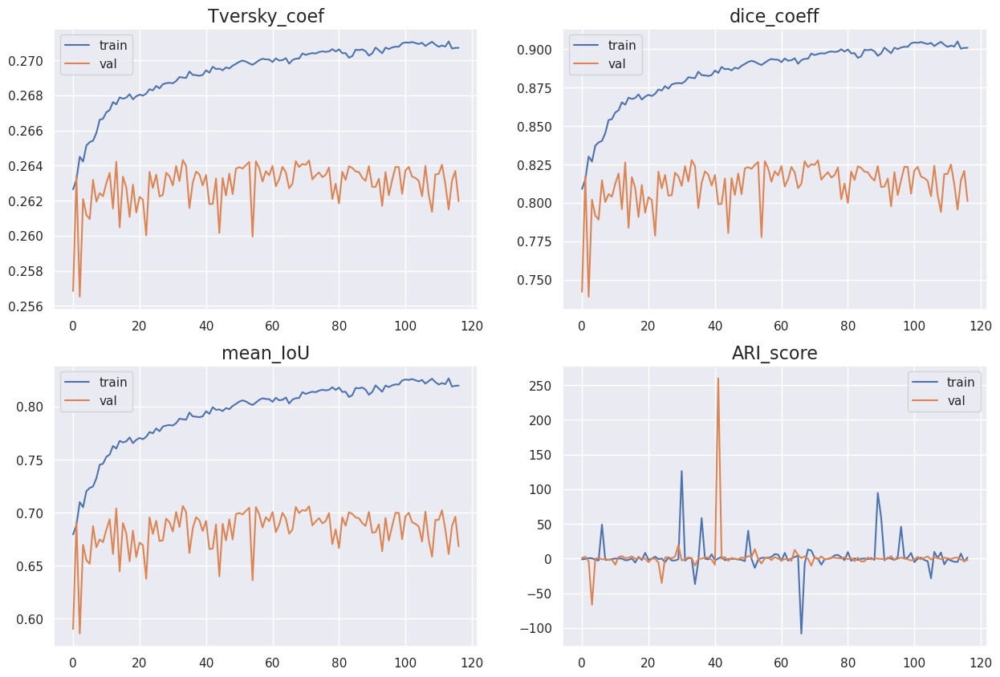

In [110]:
afficher_les_metriques( result_4 )

In [111]:
img_gen = MyImagesGenerator( chemin_image, chemin_masque_labelIds,10, False, augmentation=aug_4, taille_des_donnees = 30 , target_size=img_res)

img, mask = img_gen.__getitem__(0)

In [112]:
img.shape

(10, 144, 288, 3)

In [113]:
mask.shape

(10, 144, 288, 8)

In [114]:
mask_pred = model_4.predict(img)

1/1 [==============================] - 1s 1s/step


In [115]:
mask_pred.shape

(10, 144, 288, 8)

In [116]:
transformer = Mask_To_8_Groups()

In [117]:
mask_pred = [ transformer.invers_transform(i) for i in mask_pred]

In [118]:
np.unique( mask_pred )

array([0, 1, 2, 3, 4, 5, 6, 7])

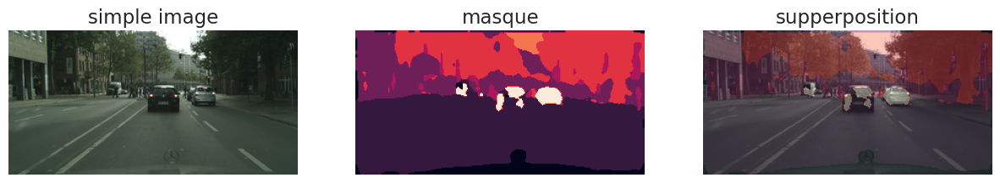

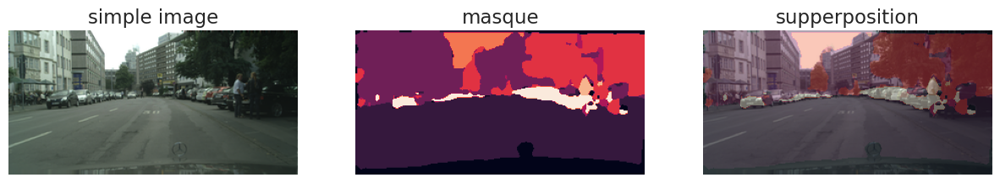

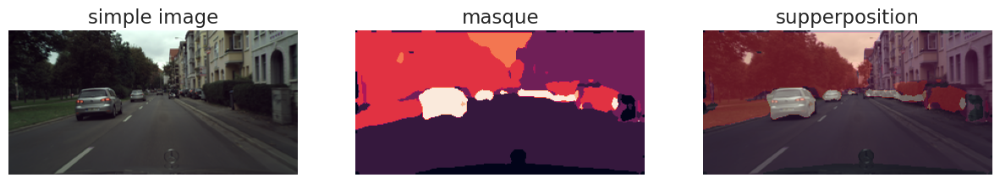

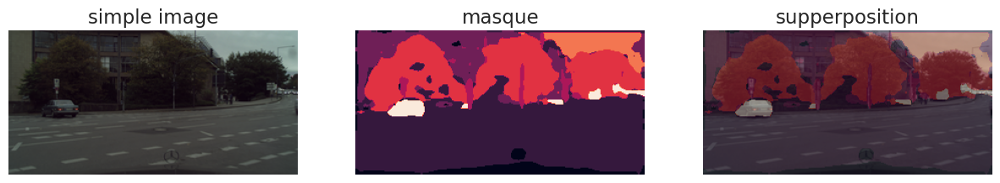

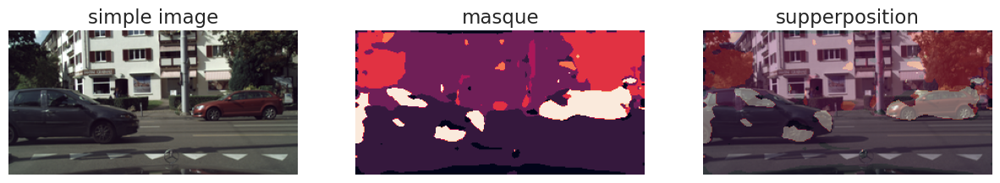

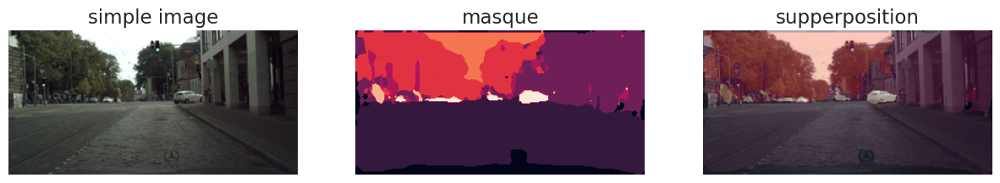

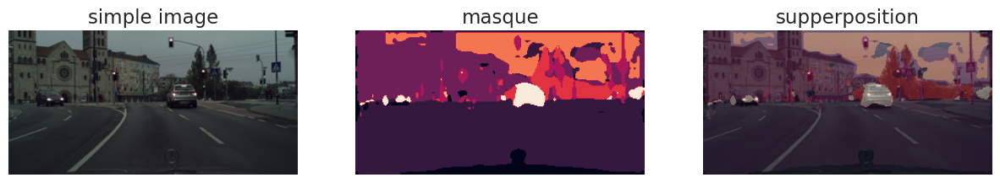

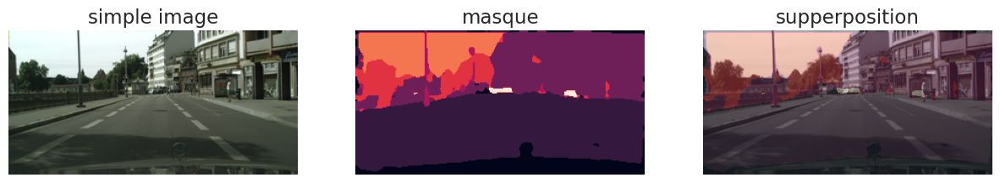

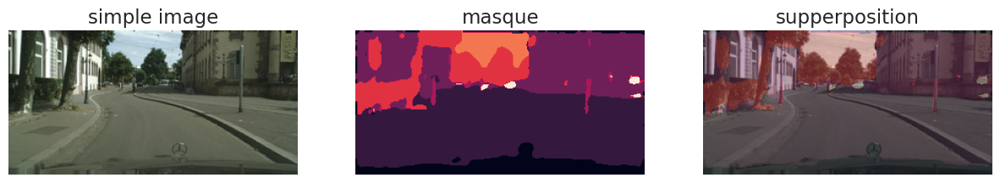

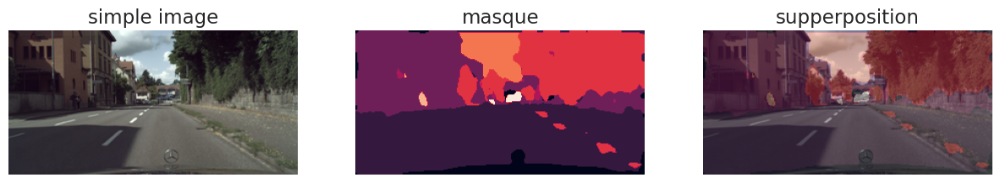

In [119]:
for i in range(10) :
    afficher_les_images_supperposees(img[i], mask_pred[i], style=3)

# <strong> E - Sans augmentation de données avec fonction perte de type categorical_focal_dice_loss

In [81]:
#resolution des images et masques
aug_5 = False
perte_5 = "categorical_focal_dice_loss"
img_res = (144,288,3)

In [82]:
model_5 = TL_PSPNET_model( img_res , 8)

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 144, 288, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 144, 288, 64  1792        ['input_5[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 144, 288, 64  36928       ['block1_conv1[0][0]']           
                                )                                                           

In [83]:
# binary_crossentropy, categorical_crossentropy, sparse_categorical_crossentropy

model_5.compile(optimizer = Adam(lr = 2.e-2 ),
                loss = categorical_focal_dice_loss ,
                metrics = [ARI_score, mean_IoU, dice_coeff, Tversky_coef ],
                run_eagerly=True
               )  

##################################################
###########     POINTS DE CONTROLE     ###########
checkpoint_path_5 = f"models/{model_name}_Loss={perte_5}_aug={aug_5}_/cp.ckpt"
checkpoint_dir_5 = os.path.dirname(checkpoint_path_5)


#############################################
###########     MES CALBACKS     ############
# Seuil de convergence
my_callback = MyCallback(0.85)
# Update du learning rate
learning_rate_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
# Sauvegarde des poids du modèle
cp_callback_5 = tf.keras.callbacks.ModelCheckpoint(filepath = checkpoint_path_5,
                                                   save_weights_only = True,
                                                   verbose = 1,
                                                   save_freq = 40
                                                  )
early_stopping_5 = tf.keras.callbacks.EarlyStopping(
                                                    monitor='loss',
                                                    min_delta=0.001,
                                                    patience=15,
                                                    verbose= 1,
                                                    mode='min',
                                                    baseline=None,
                                                    restore_best_weights=True
                                                    )

###################################################
###############                     ###############
MyImagesGenerator.nombre_d_instances = 0
charger_les_poids_5 = False

In [84]:
if charger_les_poids_5  :
    model_5.load_weights(checkpoint_path_5)
    
    
history_5 = model_5.fit_generator( 
    generator= MyImagesGenerator(chemin_image, chemin_masque_labelIds,30, True, augmentation=aug_5, taille_des_donnees= 120, target_size=img_res),
    validation_data= MyImagesGenerator(chemin_image, chemin_masque_labelIds,20, True, augmentation=aug_5, taille_des_donnees= 40, target_size=img_res),
    epochs= 450,
    callbacks = [ my_callback, learning_rate_callback, cp_callback_5, early_stopping_5 ] ,
    max_queue_size=12,
    use_multiprocessing= False
)
# Sauvegarde complète du modèle
model_5.save(checkpoint_dir_5+f"/Complete_model_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.h5")

Epoch 1/450
4/4 [==============================] - 58s 14s/step - loss: 0.9908 - ARI_score: -1.6161 - mean_IoU: 0.2480 - dice_coeff: 0.3800 - Tversky_coef: 0.2248 - val_loss: 1.0670 - val_ARI_score: -0.9538 - val_mean_IoU: 0.3011 - val_dice_coeff: 0.4628 - val_Tversky_coef: 0.2320 - lr: 0.0200
Epoch 2/450
4/4 [==============================] - 53s 13s/step - loss: 0.8428 - ARI_score: 2.6665 - mean_IoU: 0.4459 - dice_coeff: 0.6164 - Tversky_coef: 0.2456 - val_loss: 1.0597 - val_ARI_score: -2.1532 - val_mean_IoU: 0.2687 - val_dice_coeff: 0.4236 - val_Tversky_coef: 0.2285 - lr: 0.0200
Epoch 3/450
4/4 [==============================] - 52s 13s/step - loss: 0.8064 - ARI_score: -0.7193 - mean_IoU: 0.4891 - dice_coeff: 0.6564 - Tversky_coef: 0.2491 - val_loss: 0.9454 - val_ARI_score: -1.3695 - val_mean_IoU: 0.3644 - val_dice_coeff: 0.5341 - val_Tversky_coef: 0.2382 - lr: 0.0200
Epoch 4/450
4/4 [==============================] - 54s 13s/step - loss: 0.7813 - ARI_score: 45.6661 - mean_IoU: 0.52

In [85]:
result_5  = pd.DataFrame( history_5.history )
result_5.drop(["lr"], axis = 1, inplace = True)
result_5["modèle"] = [model_name for _ in range( result_5.shape[0])]
result_5["Loss"] = [perte_5 for _ in range( result_5.shape[0])]
result_5["Augmentation"] = [aug_5 for _ in range( result_5.shape[0])]
result_5.to_csv(f"{model_name}_loss={perte_5}_augment={aug_5}_date={datetime.today().strftime('%Y_%m_%d-%Hh%Mmin%Ssec')}.csv", index=False)
result_5

,loss,ARI_score,mean_IoU,dice_coeff,Tversky_coef,val_loss,val_ARI_score,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.990788,-1.616062,0.247964,0.379992,0.224828,1.066975,-0.953805,0.301128,0.462828,0.231956,Transfert_learning_PSPNET,categorical_focal_dice_loss,False
1,0.842830,2.666524,0.445948,0.616440,0.245608,1.059685,-2.153205,0.268731,0.423579,0.228455,Transfert_learning_PSPNET,categorical_focal_dice_loss,False
2,0.806389,-0.719288,0.489136,0.656379,0.249108,0.945397,-1.369458,0.364374,0.534111,0.238220,Transfert_learning_PSPNET,categorical_focal_dice_loss,False
3,0.781313,45.666069,0.522616,0.686146,0.251720,0.827772,-2.453175,0.479081,0.647706,0.248247,Transfert_learning_PSPNET,categorical_focal_dice_loss,False
4,0.769410,-0.036077,0.532863,0.695091,0.252513,0.832597,-3.325181,0.477449,0.646172,0.248114,Transfert_learning_PSPNET,categorical_focal_dice_loss,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
119,0.211605,-0.652038,0.809045,0.894434,0.270186,0.426899,-1.366361,0.645251,0.784099,0.260474,Transfert_learning_PSPNET,categorical_focal_dice_loss,False
120,0.210812,1.520001,0.808550,0.894104,0.270158,0.402829,1.452204,0.671114,0.803059,0.262137,Transfert_learning_PSPNET,categorical_focal_dice_loss,False
121,0.211666,-0.182833,0.808043,0.893805,0.270136,0.373129,-1.118694,0.699375,0.823019,0.263869,Transfert_learning_PSPNET,categorical_focal_dice_loss,False
122,0.210683,-1244.062988,0.808630,0.894177,0.270168,0.423546,-0.020739,0.657411,0.793257,0.261236,Transfert_learning_PSPNET,categorical_focal_dice_loss,False


In [86]:
start = 0

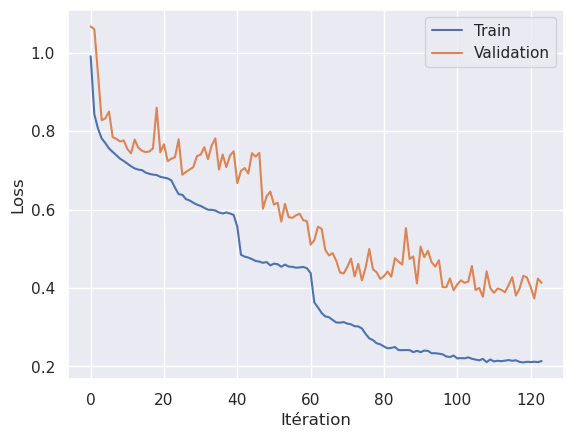

In [87]:
plt.plot(result_5.index[start:], result_5["loss"][start:])
plt.plot(result_5.index[start:], result_5["val_loss"][start:])
plt.xlabel('Itération')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()
#plt.plot(result.index, result["dice_coeff"])


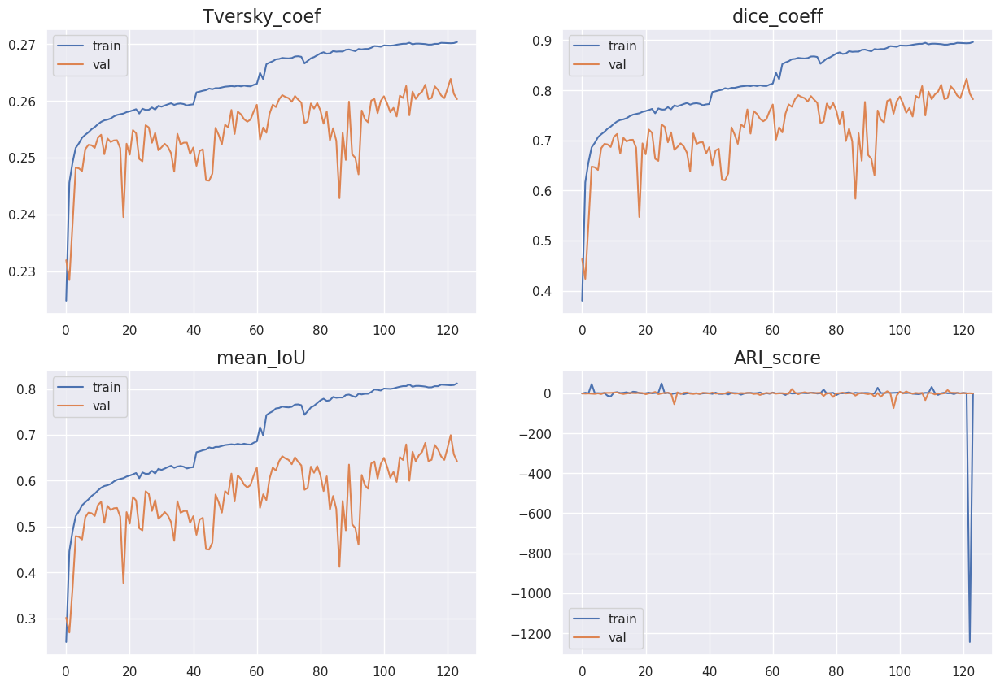

In [88]:
afficher_les_metriques( result_5 )

In [89]:
img_gen = MyImagesGenerator( chemin_image, chemin_masque_labelIds,10, False, augmentation=aug_5, taille_des_donnees = 30 , target_size=img_res)

img, mask = img_gen.__getitem__(0)

In [90]:
img.shape

(10, 144, 288, 3)

In [91]:
mask.shape

(10, 144, 288, 8)

In [92]:
mask_pred = model_5.predict(img)

1/1 [==============================] - 1s 924ms/step


In [93]:
mask_pred.shape

(10, 144, 288, 8)

In [94]:
transformer = Mask_To_8_Groups()

In [95]:
mask_pred = [ transformer.invers_transform(i) for i in mask_pred]

In [96]:
np.unique( mask_pred )

array([0, 1, 2, 3, 4, 5, 6, 7])

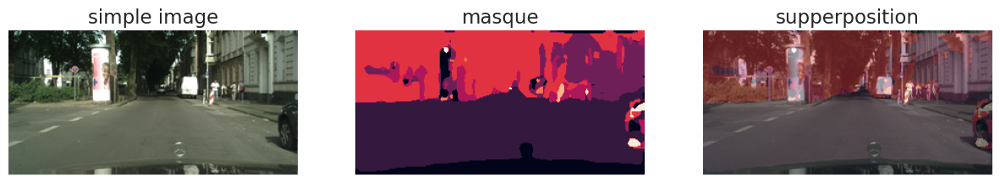

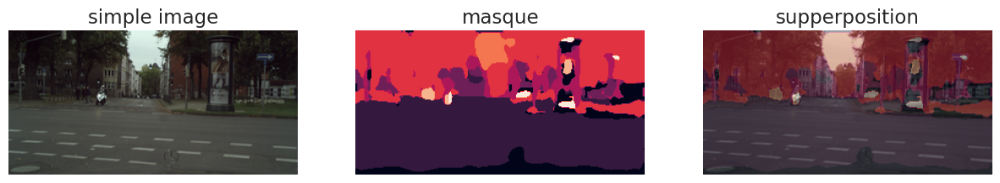

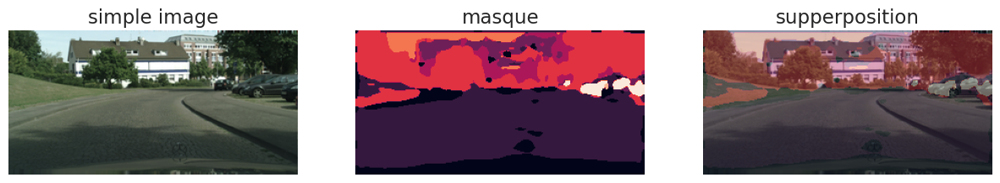

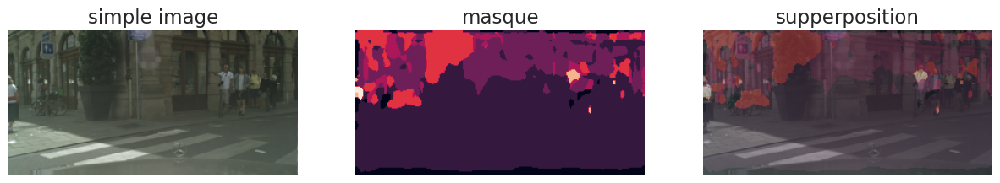

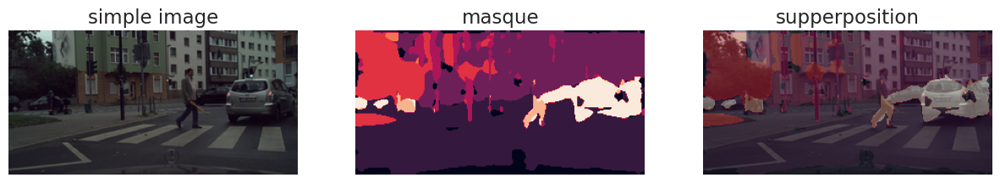

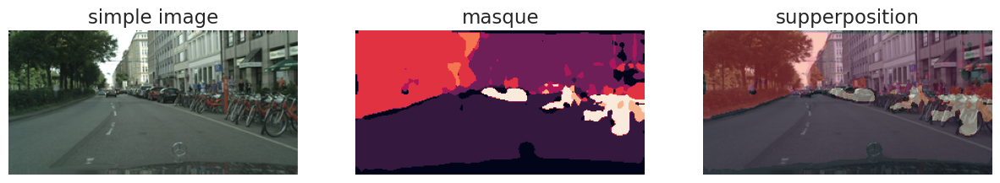

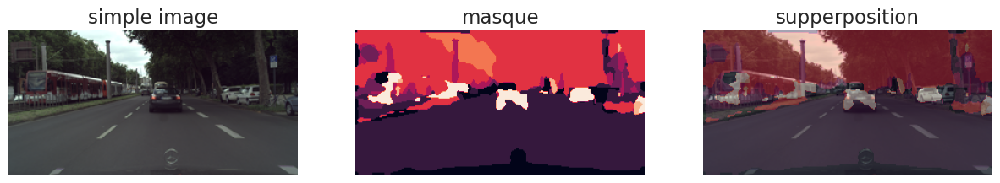

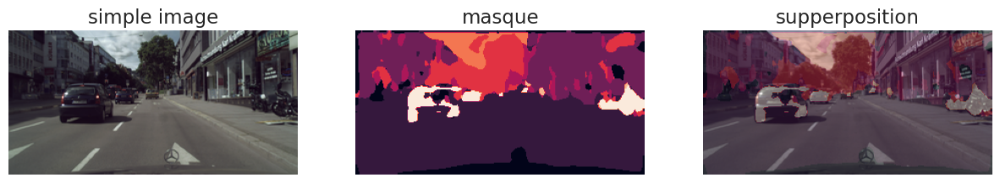

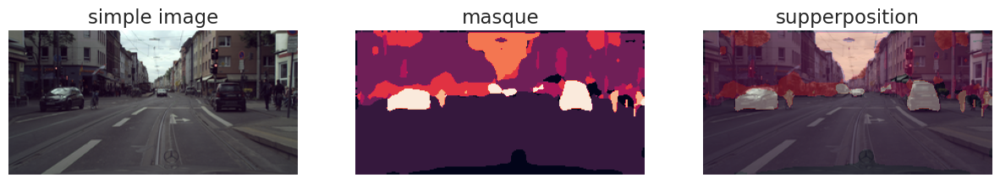

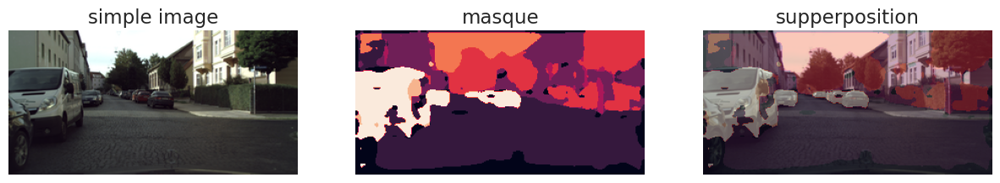

In [97]:
for i in range(10) :
    afficher_les_images_supperposees(img[i], mask_pred[i], style=3)

In [124]:
recap = pd.DataFrame([result_1.iloc[-result_1.shape[0]//2:,:].max().values , 
                      result_2.iloc[-result_2.shape[0]//2:,:].max().values,
                      result_3.iloc[-result_3.shape[0]//2:,:].max().values, 
                      result_4.iloc[-result_4.shape[0]//2:,:].max().values,
                      result_5.iloc[-result_5.shape[0]//2:,:].max().values
                     ],
                     columns= result_1.keys()
                    ).drop(["loss","ARI_score","val_ARI_score","val_loss"], axis = 1)

recap

,mean_IoU,dice_coeff,Tversky_coef,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.485904,0.653830,0.248807,0.477900,0.645700,0.248111,Transfert_learning_PSPNET,jaccard_loss,False
1,0.557583,0.715836,0.254248,0.516285,0.680246,0.251151,Transfert_learning_PSPNET,dice_loss,False
2,0.544090,0.704692,0.254380,0.436823,0.607986,0.245777,Transfert_learning_PSPNET,categorical_focal_loss,False
3,0.826680,0.905108,0.271071,0.706029,0.827595,0.264290,Transfert_learning_PSPNET,categorical_focal_jaccard_loss,False
4,0.812116,0.896303,0.270347,0.699375,0.823019,0.263869,Transfert_learning_PSPNET,categorical_focal_dice_loss,False


In [125]:
recap.style.highlight_min(axis=0, color='red').highlight_max(axis=0, color='green')

,mean_IoU,dice_coeff,Tversky_coef,val_mean_IoU,val_dice_coeff,val_Tversky_coef,modèle,Loss,Augmentation
0,0.485904,0.653830,0.248807,0.477900,0.645700,0.248111,Transfert_learning_PSPNET,jaccard_loss,False
1,0.557583,0.715836,0.254248,0.516285,0.680246,0.251151,Transfert_learning_PSPNET,dice_loss,False
2,0.544090,0.704692,0.254380,0.436823,0.607986,0.245777,Transfert_learning_PSPNET,categorical_focal_loss,False
3,0.826680,0.905108,0.271071,0.706029,0.827595,0.264290,Transfert_learning_PSPNET,categorical_focal_jaccard_loss,False
4,0.812116,0.896303,0.270347,0.699375,0.823019,0.263869,Transfert_learning_PSPNET,categorical_focal_dice_loss,False


In [126]:
#if "recap.csv" in os.listdir() : 
#    x = pd.read_csv("recep.csv")
#    recap = pd.concat([x , recap], axis = 0, ignore_index=True)
#    recap.drop_duplicates(["modèle","Loss","Augmentation"], inplace=True)

recap.to_csv(f"recap_{model_name}.csv", index = False)
